In [1]:
!pip install -q ipyplot

In [2]:
import os
import numpy as np 
import pandas as pd 
import glob
from ipyplot import plot_images
import cv2
import torch
from tqdm import tqdm

# Load data

In [3]:
df_train = pd.read_csv('/kaggle/input/shift-cv-winter-2023/train.csv')
print(len(df_train))

2664


In [4]:
path = '/kaggle/input/shift-cv-winter-2023/train/train/'

df_train['filename'] = df_train['filename'].apply(lambda x: path + x)
df_train.head()

,filename,blur
0,/kaggle/input/shift-cv-winter-2023/train/train...,0.0
1,/kaggle/input/shift-cv-winter-2023/train/train...,0.0
2,/kaggle/input/shift-cv-winter-2023/train/train...,0.0
3,/kaggle/input/shift-cv-winter-2023/train/train...,0.0
4,/kaggle/input/shift-cv-winter-2023/train/train...,1.0


In [5]:
test_imgs = []
for file in glob.glob("/kaggle/input/shift-cv-winter-2023/test/test/*.jpg"):
    test_imgs.append({'filename': file})
df_test = pd.DataFrame(test_imgs)
print("Test images: ", len(df_test))

Test images:  774


In [6]:
train_blur = df_train[df_train["blur"]==1]
train_sharp = df_train[df_train["blur"]==0]

print("blur images: ", len(train_blur))
print("sharp images: ", len(train_sharp))

blur images:  1297
sharp images:  1367


# Show several sharp images


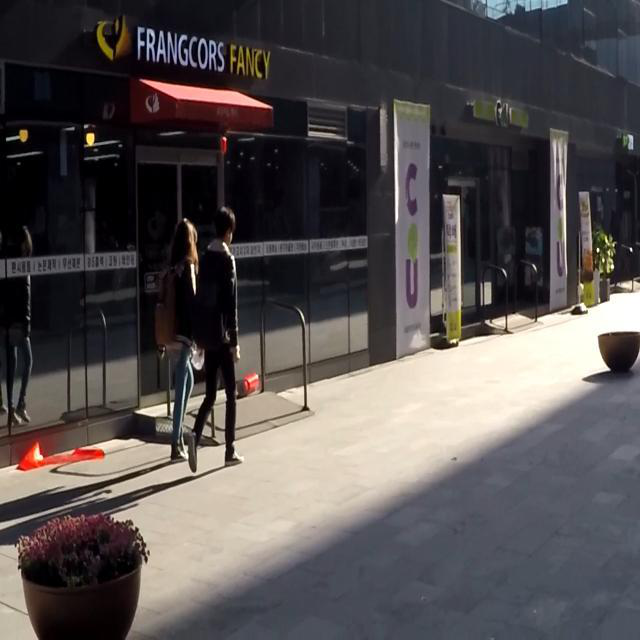
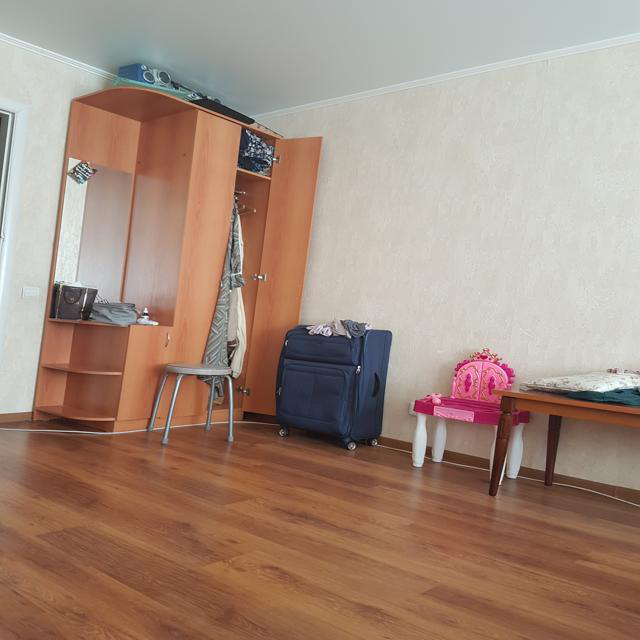
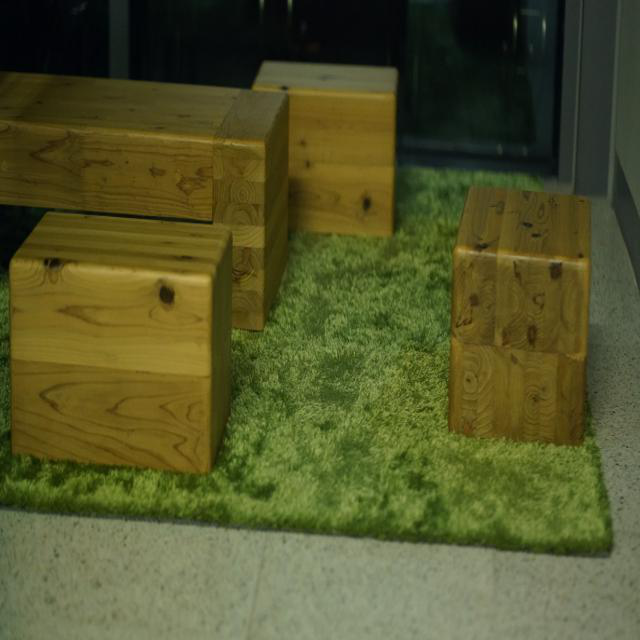
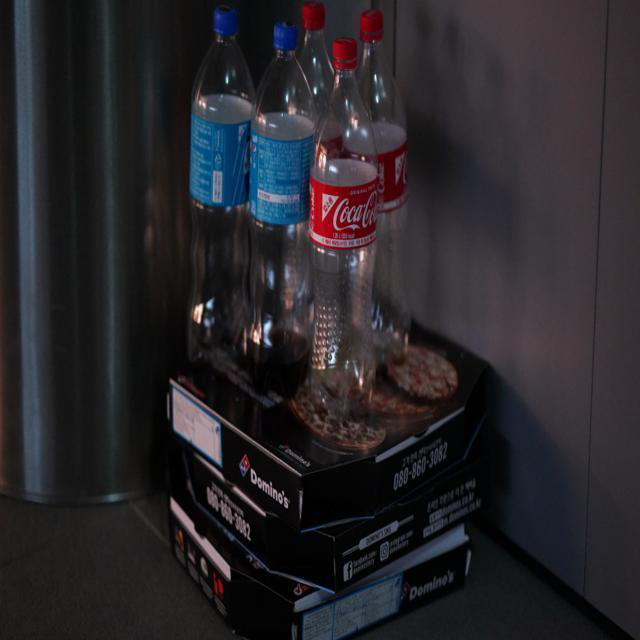
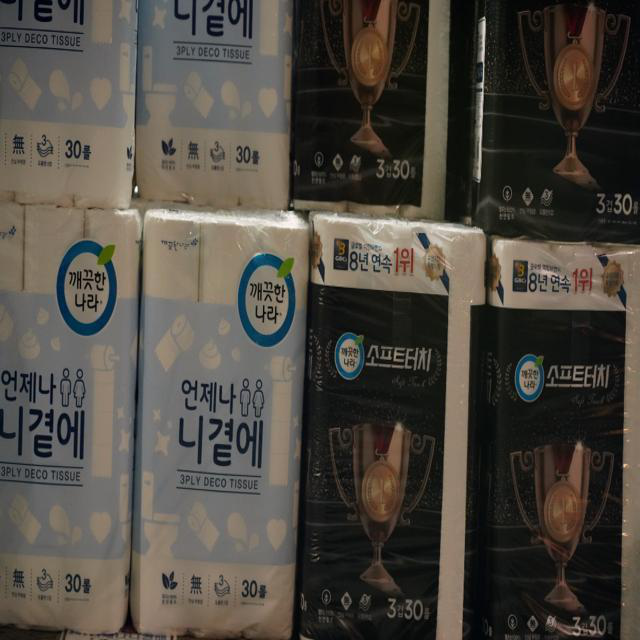
...
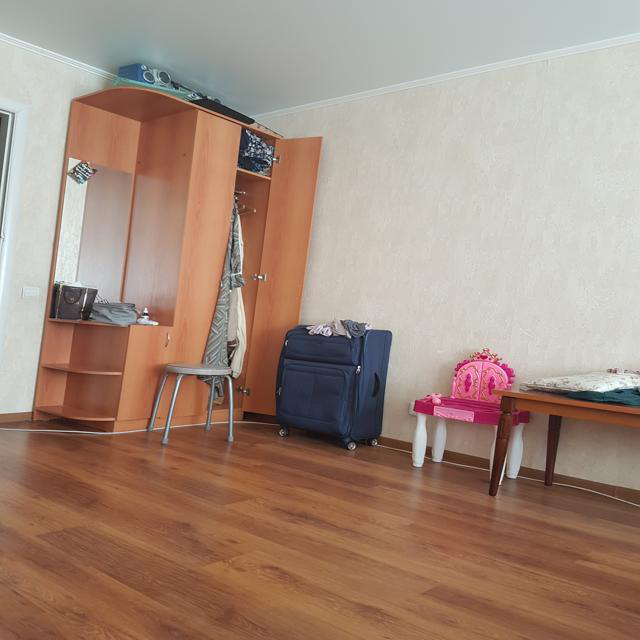
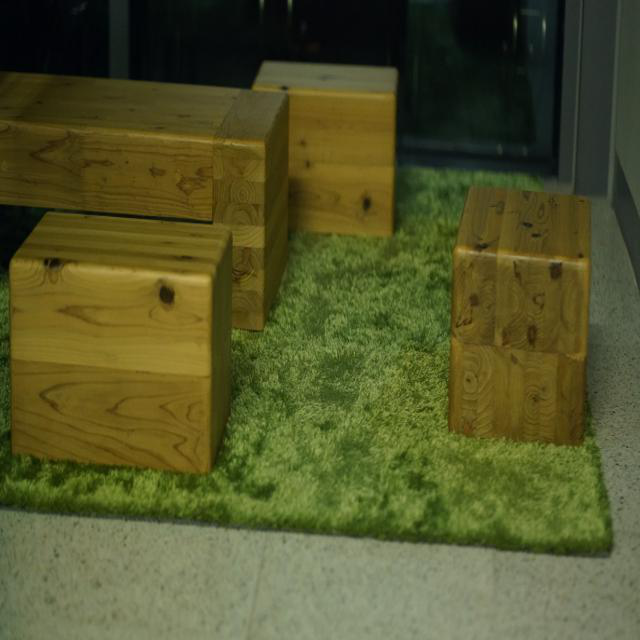
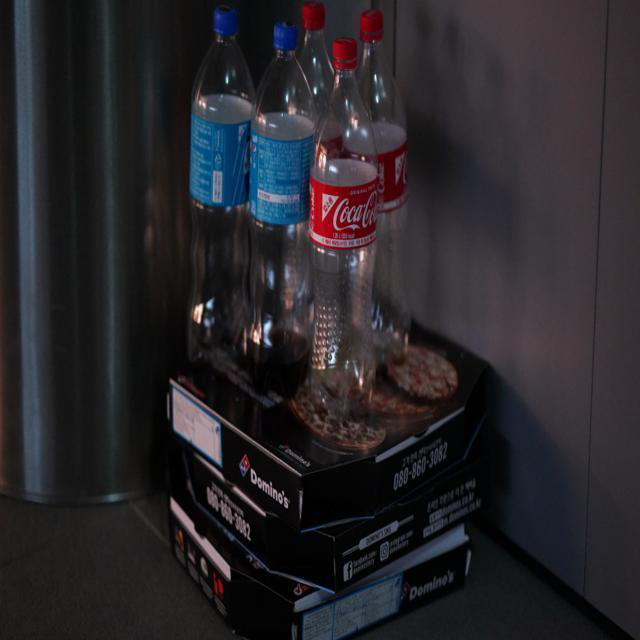
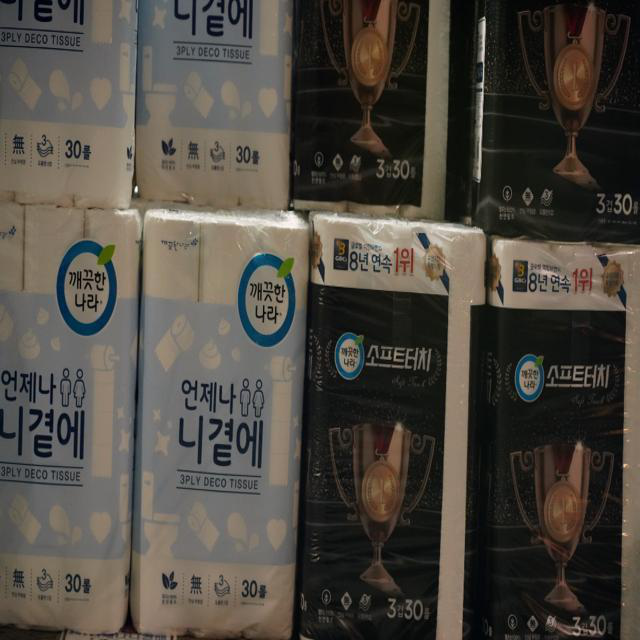
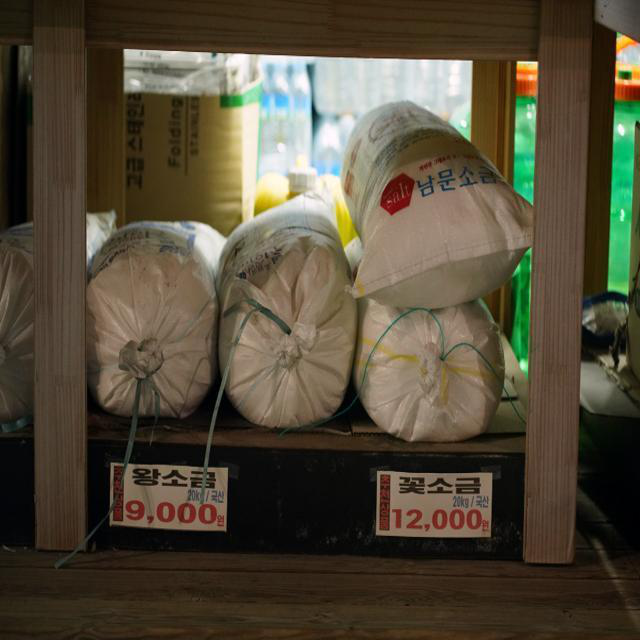

In [7]:
images = train_sharp.filename.sample(6).tolist()
plot_images(images, max_images=10,img_width=220,force_b64=True)

# Show several blur images


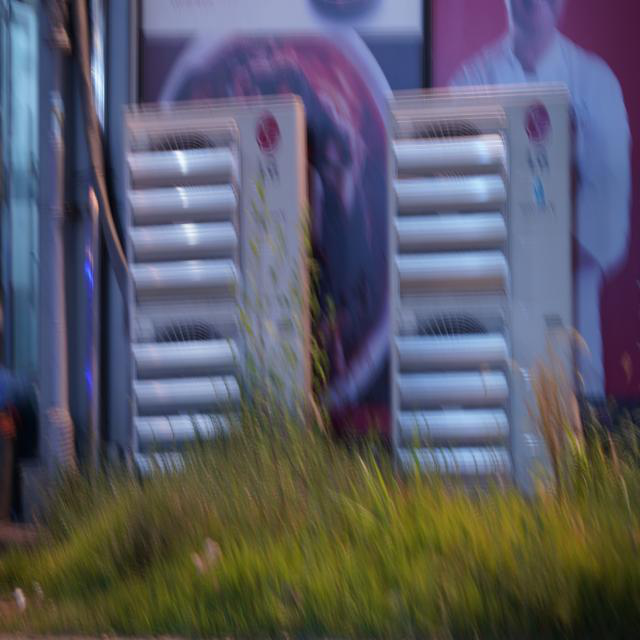
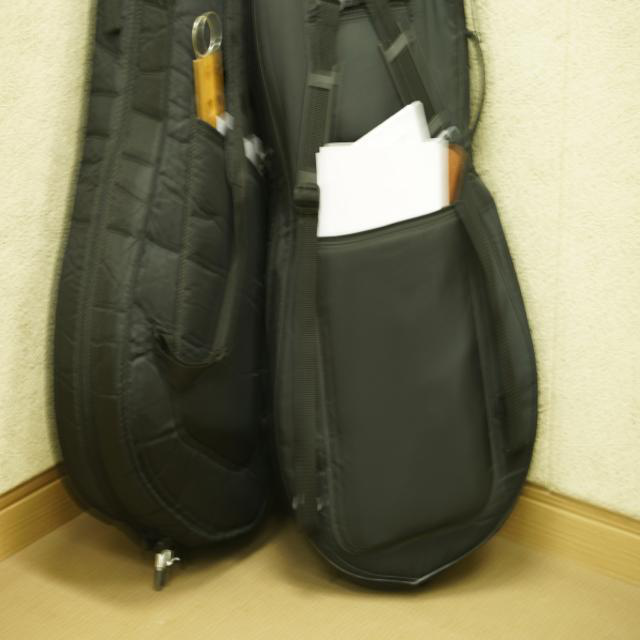
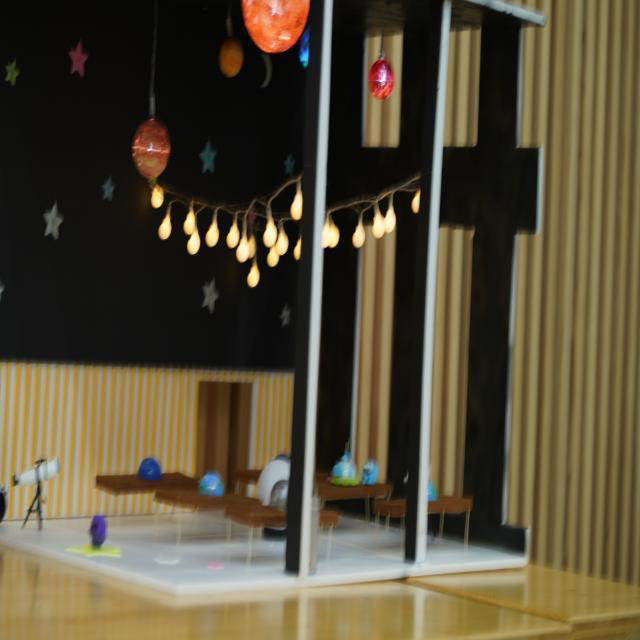
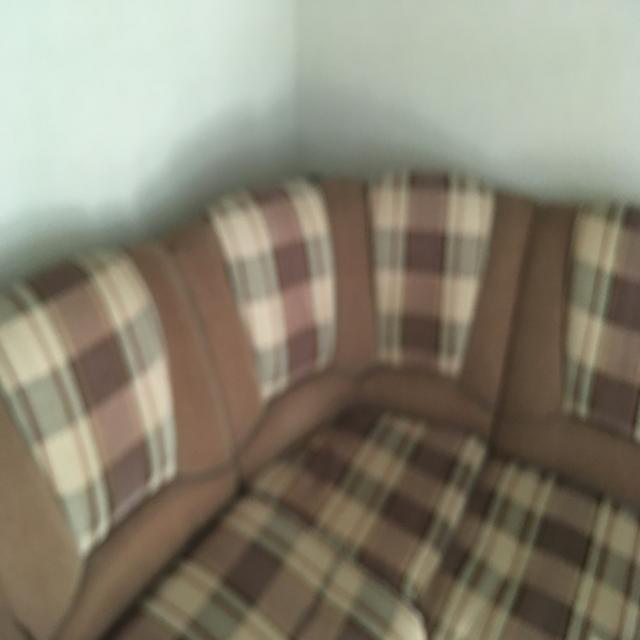
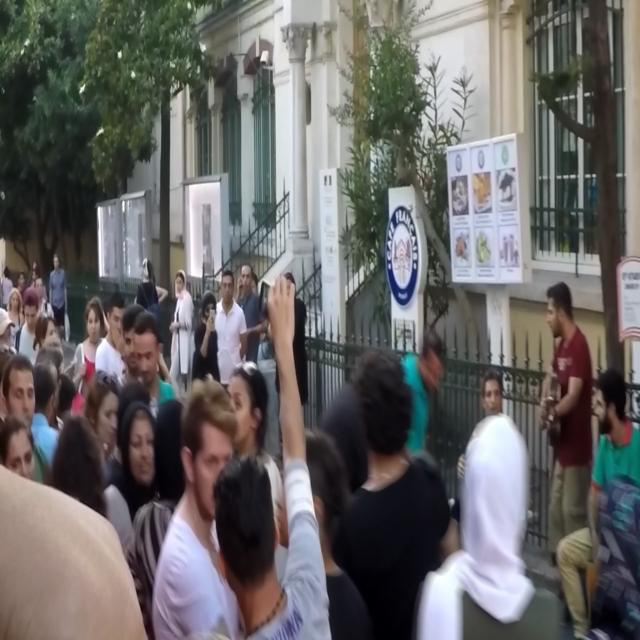
...
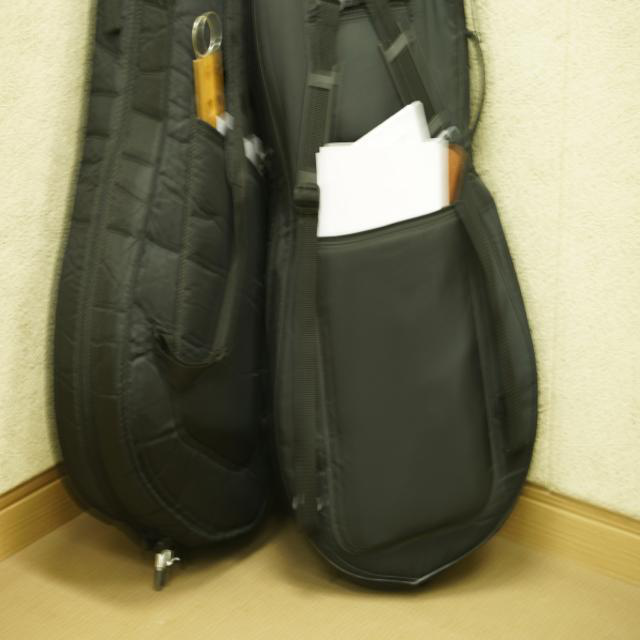
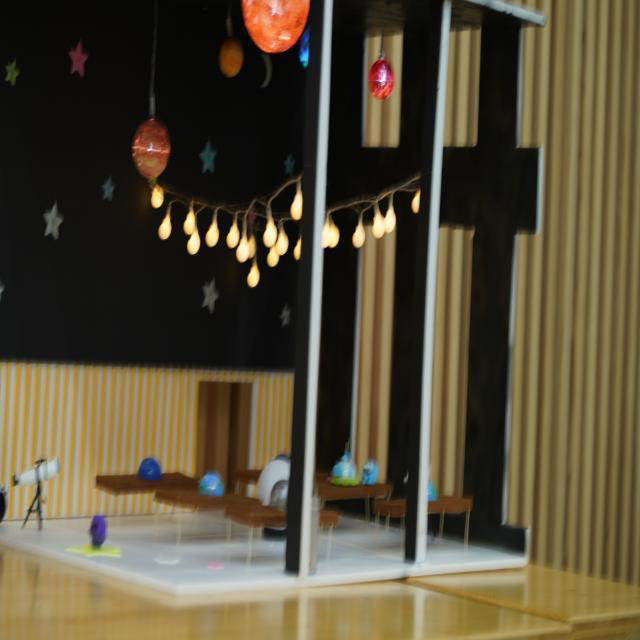
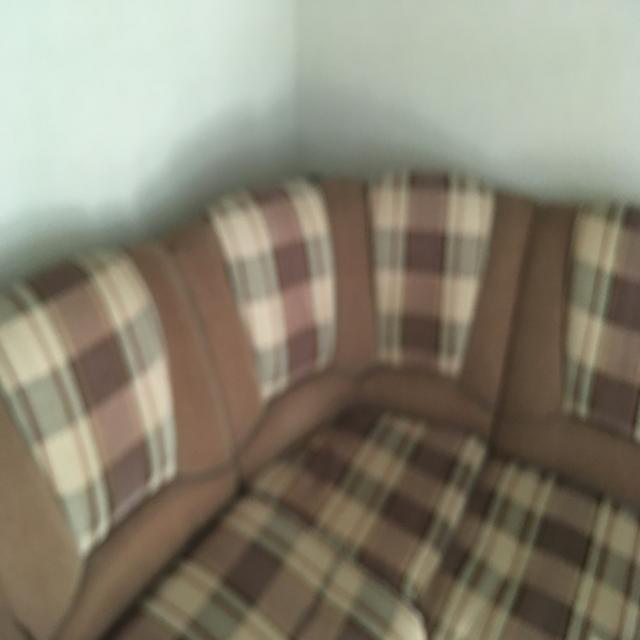
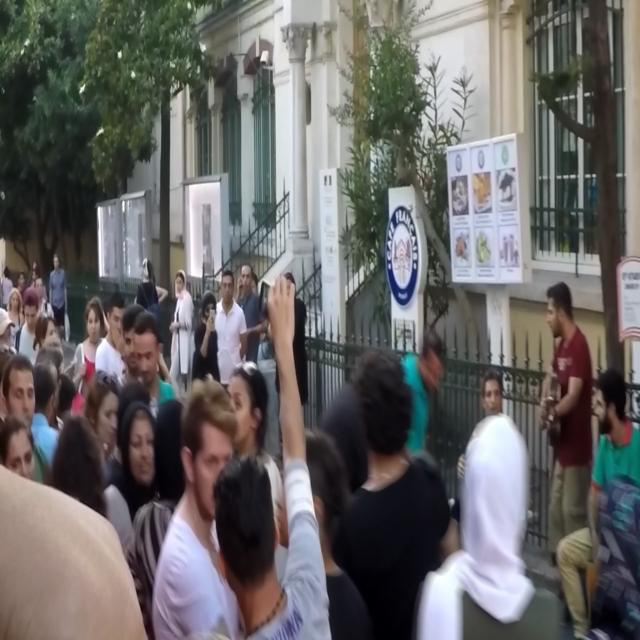
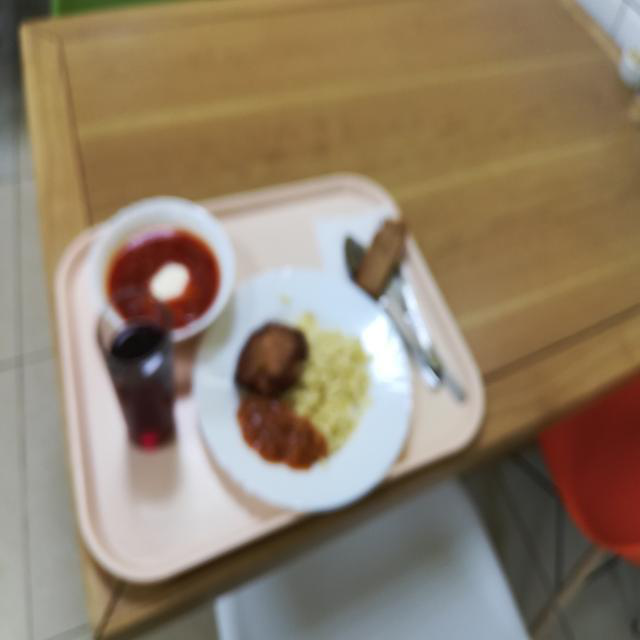

In [8]:
images = train_blur.filename.sample(6).tolist()
plot_images(images,max_images=10,img_width=220,force_b64=True)

# Create custom dataset and dataloader

In [9]:
def read_image_gray(path):
    return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2GRAY)

In [10]:
from torch.utils.data import Dataset, DataLoader

class CustomDataset(Dataset):
    def __init__(self, df):
        self.df = df
               
    def __len__(self):
        return len(self.df)


class CustomDatasetTrain(CustomDataset):
    def __init__(self, df, transform=None):
        super().__init__(df)
        self.transform = transform
   
    def __getitem__(self,idx):
        image = self.df.filename.iloc[idx]
        image = read_image_gray(image)
        if self.transform:
            image = self.transform(image)
        label = self.df.blur.iloc[idx]
        return {'image': image, 'label': label}


class CustomDatasetTest(CustomDataset):
    def __getitem__(self,idx):
        image = self.df.filename.iloc[idx]
        image = read_image_gray(image)
        return {'image': image}

In [11]:
train_dataset = CustomDatasetTrain(df_train)

train_dataloader = DataLoader(
            dataset=train_dataset,
            batch_size=16,
            ),

# Classical functions for calculating blur measure 

In [12]:
def calc_fft_measure(gray_img, size=40):
    """ Определение заблюренности изображения с помощью Fourier transform:

    - Изображение переводится в частотный спектр с помощью fft, производится сдвиг начала координат и
    зануляется низкочастотный спектр.
    - Частотный спектр переводится обратно в изображение с помощью inverse fft.
    - Считается магнитуда, определяется уровень заблюренности картинки.
    Чем больше полученное значение, тем более размыто изображение
    """
    (n, h, w) = gray_img.shape
    (cx, cy) = (int(w / 2.0), int(h / 2.0))
    fft = np.fft.fft2(gray_img, axes=(1, 2))
    fftShift = np.fft.fftshift(fft, axes=(1, 2))

    fftShift[:, cy - size : cy + size, cx - size : cx + size] = 0
    fftShift = np.fft.ifftshift(fftShift, axes=(1, 2))
    recon = np.fft.ifft2(fftShift, axes=(1, 2))
    
    magnitude = 20 * np.log(np.abs(recon))
    mean = 1/np.average(magnitude, axis=(1, 2))

    return mean

In [13]:
def calc_tv_measure(gray_img):
    """ Определение заблюренности изображения с помощью Total Variation:

    Берется отношение суммы квадратов разницы между соседними писелями к сумме модулей разницы.
    Чем больше полученное значение, тем более размыто изображение

    """
    gray_img = gray_img.detach().clone()
    gray_img = gray_img[:, gray_img.shape[1]//4:3*gray_img.shape[1]//4,gray_img.shape[2]//4:3*gray_img.shape[2]//4]
    
    w_variance = torch.sum(torch.pow(gray_img[:, :, 1:] - gray_img[:, :, :-1], 2), dim=[1, 2])
    h_variance = torch.sum(torch.pow(gray_img[:, 1:, :] - gray_img[:, :-1, :], 2), dim=[1, 2])

    l2_score = (h_variance + w_variance)

    w_variance = torch.sum(torch.abs(gray_img[:, :, 1:] - gray_img[:, :, :-1]), dim=[1, 2])
    h_variance = torch.sum(torch.abs(gray_img[:, 1:, :] - gray_img[:, :-1, :]), dim=[1, 2])
    
    l1_score = (h_variance + w_variance)
    
    tv_measure = l1_score/l2_score
    
    return tv_measure

# Calculate TV and FFT measure

In [14]:
tv_measures = []
fft_measures = []

for dl in train_dataloader:
    for batch in tqdm(dl):
        tv_measures.extend(calc_tv_measure(batch['image']).tolist())
        fft_measures.extend(calc_fft_measure(batch['image']).tolist())

df_train['tv_measure'] = tv_measures
df_train['fft_measure'] = fft_measures   

100%|██████████| 167/167 [01:46<00:00,  1.57it/s]


In [15]:
df_train.head()

,filename,blur,tv_measure,fft_measure
0,/kaggle/input/shift-cv-winter-2023/train/train...,0.0,4.340060,0.027601
1,/kaggle/input/shift-cv-winter-2023/train/train...,0.0,2.989293,0.025317
2,/kaggle/input/shift-cv-winter-2023/train/train...,0.0,4.313049,0.033126
3,/kaggle/input/shift-cv-winter-2023/train/train...,0.0,5.828151,0.040531
4,/kaggle/input/shift-cv-winter-2023/train/train...,1.0,5.371748,0.054616


# Calculate ROC AUC metric on train dataset

In [16]:
from sklearn.metrics import roc_auc_score

print('ROC AUC using Total Variation:', np.round(roc_auc_score(df_train.blur.tolist(), df_train.tv_measure.tolist()), 5))
print('ROC AUC using Furrier Trasform:', np.round(roc_auc_score(df_train.blur.tolist(), df_train.fft_measure.tolist()), 5))      

ROC AUC using Total Variation: 0.79844
ROC AUC using Furrier Trasform: 0.75522


# Predict on test dataset

In [17]:
test_dataset = CustomDatasetTest(df_test)
test_dataloader = DataLoader(dataset=test_dataset, batch_size=16),

tv_measures = []
fft_measures = []

for dl in test_dataloader:
    for batch in tqdm(dl):
        tv_measures.extend(calc_tv_measure(batch['image']).tolist())
        fft_measures.extend(calc_fft_measure(batch['image']).tolist())

df_test['blur'] = tv_measures
df_test['filename'] = df_test['filename'].apply(lambda x : os.path.split(x)[1])
df_test.to_csv('/kaggle/working/submission.csv', index=False)

100%|██████████| 49/49 [00:30<00:00,  1.63it/s]
